In [26]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures

In [2]:
df = pd.read_csv('listings.csv')

The dataset represents information about Airbnb listings in Madrid and their prices. 
The dataset has 74 columns and 20352 rows. 

There are missing values: bathrooms and calendar_updated are 100% nulls, license 84% nulls, host_about, host_response_time, host_response_rate  - 40-50 % nulls. 

Some columns like id, listing_url, scrape_id, last_scraped, name, description, neighborhood_overview, picture_url, host_id, host_url, host_name, host_location, host_about, 
host_thumbnail_url, object host_picture_url, license, calendar_last_scraped will be removed because don't provide relevant for analysis. 
calculated_host_listings_count, calculated_host_listings_count_entire_homes, calculated_host_listings_count_private_rooms,   
calculated_host_listings_count_shared_room - remove because are not relevant. 
host_listings_count - removed

Host_neighbourhood looks the same as neigbourhood so we will remove the one with more nans.

Looks like host_response_time, host_response_rate seems the same, need to investigate,
host_listings_count, host_total_listings_count also look the same, 
host_has_profile_pic, host_identity_verified need to investigate, 
number_of_reviews_ltm,  number_of_reviews_l30d will be removed because general number of reviews are move relevant. 

We have to decide what to do minimum_nights, maximum_nights, 'minimum_minimum_nights', 'maximum_minimum_nights',  'minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm', 'maximum_nights_avg_ntm' have to be investigated futher. So we will make correlations to see which ones are the same. 

Since the first 2 columns minimum_nights, maximum_nights correlate 0.98 and 0.93 percent with other we will leave only these 2.

Bathroom text we consider important because it tells how many bathrooms, but there are many categories and we should group them later. 

Duplicates ???????????

In [3]:
df.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,6369,https://www.airbnb.com/rooms/6369,20201217180603,2020-12-19,"Rooftop terrace room , ensuite bathroom",Excellent connection with the AIRPORT and EXHI...,NaN,https://a0.muscache.com/pictures/683224/4cc318...,13660,https://www.airbnb.com/users/show/13660,...,10.0,10.0,10.0,NaN,f,1,0,1,0,0.59
1,21853,https://www.airbnb.com/rooms/21853,20201217180603,2020-12-19,Bright and airy room,We have a quiet and sunny room with a good vie...,We live in a leafy neighbourhood with plenty o...,https://a0.muscache.com/pictures/68483181/87bc...,83531,https://www.airbnb.com/users/show/83531,...,10.0,8.0,9.0,NaN,f,2,0,2,0,0.44
2,23001,https://www.airbnb.com/rooms/23001,20201217180603,2020-12-18,Apartmento Arganzuela- Madrid Rio,"Apartamento de tres dormitorios dobles, gran s...","Barrio Arganzuela, junto a Madrid Rio, zonas c...",https://a0.muscache.com/pictures/58e6a770-509c...,82175,https://www.airbnb.com/users/show/82175,...,NaN,NaN,NaN,NaN,f,6,5,1,0,NaN
3,24805,https://www.airbnb.com/rooms/24805,20201217180603,2020-12-18,Gran Via Studio Madrid,"Studio located 50 meters from Gran Via, next t...","The area is next to the Gran Via, so people li...",https://a0.muscache.com/pictures/miso/Hosting-...,101471,https://www.airbnb.com/users/show/101471,...,10.0,10.0,10.0,NaN,f,1,1,0,0,0.14
4,24836,https://www.airbnb.com/rooms/24836,20201217180603,2020-12-19,"Select the Madrid more ""cool"".","<b>The space</b><br />Select the Madrid more ""...",NaN,https://a0.muscache.com/pictures/573273/8f594d...,101653,https://www.airbnb.com/users/show/101653,...,10.0,10.0,10.0,VT-296,f,1,1,0,0,0.58


In [9]:
df.shape

(20352, 74)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20352 entries, 0 to 20351
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            20352 non-null  int64  
 1   listing_url                                   20352 non-null  object 
 2   scrape_id                                     20352 non-null  int64  
 3   last_scraped                                  20352 non-null  object 
 4   name                                          20349 non-null  object 
 5   description                                   19245 non-null  object 
 6   neighborhood_overview                         12239 non-null  object 
 7   picture_url                                   20351 non-null  object 
 8   host_id                                       20352 non-null  int64  
 9   host_url                                      20352 non-null 

In [7]:
df.isnull().sum()

id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
name                                               3
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               5878
Length: 74, dtype: int64

In [13]:
df.isnull().sum()/len(df)*100

id                                                0.000000
listing_url                                       0.000000
scrape_id                                         0.000000
last_scraped                                      0.000000
name                                              0.014741
description                                       5.439269
neighborhood_overview                            39.863404
picture_url                                       0.004914
host_id                                           0.000000
host_url                                          0.000000
host_name                                         0.024568
host_since                                        0.024568
host_location                                     0.240763
host_about                                       49.223664
host_response_time                               45.523781
host_response_rate                               45.523781
host_acceptance_rate                             29.0487

In [33]:
pd.set_option('display.max_rows', 10)

In [15]:
df['bathrooms_text'].value_counts()

1 bath               9189
1 shared bath        4059
2 baths              2414
1 private bath       1168
1.5 baths            1014
1.5 shared baths      776
2 shared baths        666
3 baths               275
2.5 baths             191
3 shared baths         93
4 shared baths         72
0 shared baths         61
4 baths                55
0 baths                53
2.5 shared baths       43
3.5 baths              33
Shared half-bath       28
6 shared baths         21
4.5 baths              20
5 baths                15
6 baths                15
Half-bath              12
4.5 shared baths        9
5 shared baths          9
8 shared baths          7
5.5 baths               6
7 baths                 4
5.5 shared baths        3
3.5 shared baths        3
11 shared baths         3
10 baths                2
6.5 baths               2
Private half-bath       2
6.5 shared baths        2
8 baths                 1
11 baths                1
14 baths                1
Name: bathrooms_text, dtype: int64

In [16]:
df['host_location']

0                                    Madrid, Madrid, Spain
1                                    Madrid, Madrid, Spain
2                       Madrid, Community of Madrid, Spain
3                                    Madrid, Madrid, Spain
4                                 Las Rozas, Madrid, Spain
5                                    Madrid, Madrid, Spain
6                                    Madrid, Madrid, Spain
7                       Madrid, Community of Madrid, Spain
8                                    Madrid, Madrid, Spain
9                       Madrid, Community of Madrid, Spain
10                                   Madrid, Madrid, Spain
11                                           United States
12                      Madrid, Community of Madrid, Spain
13                      Madrid, Community of Madrid, Spain
14                      Madrid, Community of Madrid, Spain
15                      Madrid, Community of Madrid, Spain
16                      Madrid, Community of Madrid, Spa

In [17]:
df['host_about']

0        Gay couple, heterofriendly, enjoy having guest...
1        EN-ES-FR\r\nEN\r\nHi everybody: I'm Abdel. I'm...
2        Hi,\r\n\r\nWelcome to my apartments in the dow...
3        I love treating my clients, how I would like t...
4        Mi mayor pasión es viajar y conocer culturas d...
5        I like Fine art, Photography, Cinema, travel a...
6        Apartasol offers a network of several spacious...
7        Estoy empezando en Airbnb y deseo que mis hués...
8        Hola! somos dos chicos de Madrid,  sociables, ...
9                                                      NaN
10       Apartasol offers a network of several spacious...
11       Motion Graphic Designer// Lived in West L.A  a...
12       Me llamo Patricia, tengo 50 años y soy periodi...
13       I am an artist... and I will be glad to have y...
14       Soy agradable y  hospitalaria, me gusta el cin...
15       Para mi lo importante son las personas.\r\nMe ...
16       Hola, \r\nMe encanta viajar y conocer gente de.

In [18]:
df['host_acceptance_rate']

0         73%
1         NaN
2         50%
3        100%
4        100%
5        100%
6         89%
7         NaN
8         97%
9        100%
10        89%
11        NaN
12        NaN
13       100%
14        93%
15       100%
16       100%
17       100%
18        90%
19        NaN
20       100%
21        NaN
22       100%
23        90%
24       100%
25        NaN
26       100%
27        50%
28        NaN
29       100%
30         0%
31       100%
32       100%
33       100%
34       100%
35       100%
36        93%
37       100%
38       100%
39        95%
40        NaN
41        76%
42       100%
43        NaN
44        67%
45       100%
46        33%
47        99%
48        99%
49        72%
50        82%
51        82%
52        82%
53        82%
54        99%
55        64%
56       100%
57         0%
58        93%
59       100%
60        95%
61        77%
62        75%
63       100%
64        91%
65        98%
66       100%
67        57%
68        33%
69       100%
70         0%
71    

In [19]:
df['host_neighbourhood']

0                        Hispanoamérica
1                                Aluche
2                               Legazpi
3                              Malasaña
4                              Justicia
5                               Legazpi
6                                   Sol
7                           Embajadores
8                               Palacio
9                              Malasaña
10                                  Sol
11                                 Goya
12                              Palacio
13                             Justicia
14                  Fuencarral-El Pardo
15                             Malasaña
16                             Malasaña
17                             Malasaña
18                          Embajadores
19                            La Latina
20                          Embajadores
21                            Recoletos
22                                  Sol
23                          Embajadores
24                            La Latina


In [21]:
df[['minimum_minimum_nights', 'maximum_minimum_nights',  'minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm', 'maximum_nights_avg_ntm']] 

,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm
0,1.0,1.0,1125.0,1125.0,1.0,1125.0
1,4.0,4.0,40.0,40.0,4.0,40.0
2,15.0,15.0,730.0,730.0,15.0,730.0
3,5.0,5.0,1125.0,1125.0,5.0,1125.0
4,3.0,3.0,10.0,10.0,3.0,10.0
5,2.0,2.0,1125.0,1125.0,2.0,1125.0
6,5.0,5.0,180.0,180.0,5.0,180.0
7,3.0,3.0,730.0,730.0,3.0,730.0
8,3.0,3.0,730.0,730.0,3.0,730.0
9,3.0,3.0,500.0,500.0,3.0,500.0


In [ ]:
maximum_minimum_nights, maximum_maximum_nights 

In [22]:
df['availability_30']

0        30
1        29
2         0
3        28
4        23
5        30
6        30
7         0
8        30
9         1
10       30
11       27
12        1
13        0
14       29
15        1
16        1
17       16
18       30
19        0
20        1
21        0
22       29
23       29
24       30
25       28
26       29
27       29
28        0
29        1
30        0
31        1
32       10
33        0
34       10
35        1
36       19
37        0
38       29
39       25
40        0
41        2
42        0
43        9
44       28
45       15
46        0
47        0
48       30
49        1
50        0
51        0
52        0
53        0
54       26
55       29
56       29
57       30
58       29
59       21
60       30
61       30
62       23
63       24
64        0
65       29
66       29
67       30
68        0
69        9
70       28
71       13
72        0
73       27
74        7
75       27
76        0
77        0
78        0
79       30
80        0
81        0
82       29
83  

In [23]:
df['calendar_last_scraped']

0        2020-12-19
1        2020-12-19
2        2020-12-18
3        2020-12-18
4        2020-12-19
5        2020-12-19
6        2020-12-18
7        2020-12-18
8        2020-12-19
9        2020-12-19
10       2020-12-18
11       2020-12-18
12       2020-12-19
13       2020-12-18
14       2020-12-19
15       2020-12-19
16       2020-12-19
17       2020-12-18
18       2020-12-18
19       2020-12-19
20       2020-12-18
21       2020-12-18
22       2020-12-19
23       2020-12-18
24       2020-12-19
25       2020-12-18
26       2020-12-18
27       2020-12-19
28       2020-12-18
29       2020-12-19
30       2020-12-30
31       2020-12-19
32       2020-12-18
33       2020-12-19
34       2020-12-18
35       2020-12-19
36       2020-12-18
37       2020-12-19
38       2020-12-18
39       2020-12-19
40       2020-12-19
41       2020-12-18
42       2020-12-18
43       2020-12-18
44       2020-12-19
45       2020-12-18
46       2020-12-19
47       2020-12-19
48       2020-12-19
49       2020-12-19


In [24]:
df['number_of_reviews_ltm']

0          5
1          0
2          0
3          2
4          1
5          7
6          1
7          0
8          0
9          0
10         1
11         0
12         0
13         6
14         7
15         4
16         1
17         1
18         5
19         0
20         2
21         0
22         3
23         6
24         7
25         0
26        18
27         0
28         0
29         1
30         0
31         6
32         3
33         8
34         4
35         2
36         4
37         8
38         9
39         9
40         0
41         1
42         2
43         0
44         1
45         0
46         0
47         0
48         1
49         4
50         0
51         0
52         0
53         0
54        16
55         1
56         3
57         0
58         4
59         1
60         1
61         1
62         3
63         8
64         5
65         5
66         3
67         3
68         4
69        17
70         0
71         0
72         3
73         1
74         4
75        14
76         6

<AxesSubplot:>

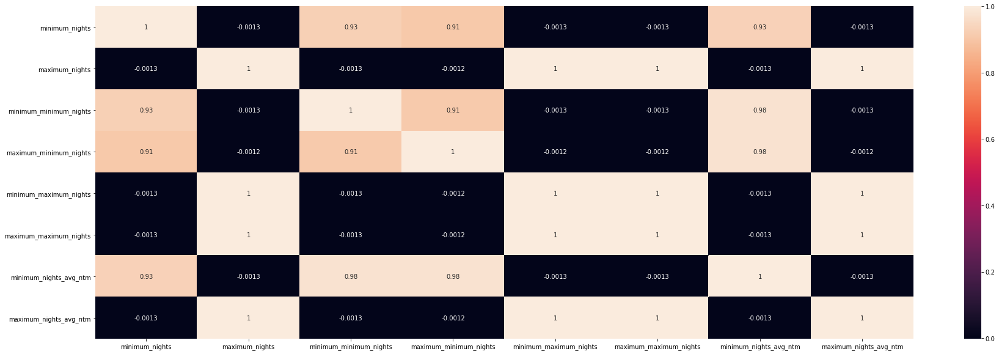

In [27]:
plt.figure(figsize=(30,10))
sns.heatmap(df.loc[:,['minimum_nights','maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm','maximum_nights_avg_ntm']].corr(), annot=True)


In [129]:
#removing unnecesary columns
df1 = df.drop(df.loc[:, 'id':'host_about'], axis = 1)
df1 = df1.drop(df1[['host_thumbnail_url', 'host_picture_url', 'license','calendar_last_scraped', 'calculated_host_listings_count' ]], axis = 1)
df1 = df1.drop(df1[['calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms','host_neighbourhood','minimum_minimum_nights', 'maximum_minimum_nights',  'minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm', 'maximum_nights_avg_ntm' ]], axis = 1)
df1 = df1.drop(df1[['host_listings_count', 'number_of_reviews_ltm',  'number_of_reviews_l30d']], axis = 1)

In [130]:
del df1['bathrooms']

In [131]:
del df1['calendar_updated']

In [62]:
df1.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'calendar_updated',
       'has_availability', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'first_review', 'last_review', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable',
       'reviews_per_month'],
      dtype='object')

In [72]:
df1.shape

(20352, 40)

In [59]:
df1.head()

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,...,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month
0,NaN,NaN,73%,t,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,NaN,Hispanoamérica,...,2020-09-20,98.0,10.0,10.0,10.0,10.0,10.0,10.0,f,0.59
1,NaN,NaN,NaN,f,2.0,"['email', 'phone', 'reviews', 'manual_offline'...",t,t,"Madrid, Spain",Cármenes,...,2018-07-15,92.0,9.0,9.0,10.0,10.0,8.0,9.0,f,0.44
2,within an hour,100%,50%,f,10.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Madrid, Comunidad de Madrid, Spain",Legazpi,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,NaN
3,NaN,NaN,100%,f,1.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",t,t,"Madrid, Spain",Universidad,...,2020-03-01,98.0,9.0,10.0,10.0,10.0,10.0,10.0,f,0.14
4,NaN,NaN,100%,t,1.0,"['email', 'phone', 'facebook', 'reviews']",t,f,NaN,Justicia,...,2020-01-26,98.0,10.0,10.0,10.0,10.0,10.0,10.0,f,0.58


In [132]:
df1.isnull().sum()/len(df)*100

host_response_time              45.523781
host_response_rate              45.523781
host_acceptance_rate            29.048742
host_is_superhost                0.024568
host_total_listings_count        0.024568
host_verifications               0.000000
host_has_profile_pic             0.024568
host_identity_verified           0.024568
neighbourhood                   39.863404
neighbourhood_cleansed           0.000000
neighbourhood_group_cleansed     0.000000
latitude                         0.000000
longitude                        0.000000
property_type                    0.000000
room_type                        0.000000
accommodates                     0.000000
bathrooms_text                   0.117925
bedrooms                         7.660181
beds                             2.014544
amenities                        0.000000
price                            0.000000
minimum_nights                   0.000000
maximum_nights                   0.000000
has_availability                 0

In [67]:
df1['price']

0         60.00
1         31.00
2         60.00
3        101.00
4        115.00
          ...  
20347     80.00
20348    445.00
20349    157.00
20350     36.00
20351     80.00
Name: price, Length: 20352, dtype: object

In [ ]:
#clean the price and remove $ and coma and convert to float 

In [133]:
df1['price'] = df1['price'].str.replace('$', '')

In [134]:
df1['price'] = df1['price'].str.replace(',', '')

In [68]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20352 entries, 0 to 20351
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   host_response_time            11087 non-null  object 
 1   host_response_rate            11087 non-null  object 
 2   host_acceptance_rate          14440 non-null  object 
 3   host_is_superhost             20347 non-null  object 
 4   host_total_listings_count     20347 non-null  float64
 5   host_verifications            20352 non-null  object 
 6   host_has_profile_pic          20347 non-null  object 
 7   host_identity_verified        20347 non-null  object 
 8   neighbourhood                 12239 non-null  object 
 9   neighbourhood_cleansed        20352 non-null  object 
 10  neighbourhood_group_cleansed  20352 non-null  object 
 11  latitude                      20352 non-null  float64
 12  longitude                     20352 non-null  float64
 13  p

In [136]:
df1['price'] = df1['price'].astype('float64')

In [76]:
df1.head()

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,...,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month
0,NaN,NaN,73%,t,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,NaN,Hispanoamérica,...,2020-09-20,98.0,10.0,10.0,10.0,10.0,10.0,10.0,f,0.59
1,NaN,NaN,NaN,f,2.0,"['email', 'phone', 'reviews', 'manual_offline'...",t,t,"Madrid, Spain",Cármenes,...,2018-07-15,92.0,9.0,9.0,10.0,10.0,8.0,9.0,f,0.44
2,within an hour,100%,50%,f,10.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Madrid, Comunidad de Madrid, Spain",Legazpi,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,NaN
3,NaN,NaN,100%,f,1.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",t,t,"Madrid, Spain",Universidad,...,2020-03-01,98.0,9.0,10.0,10.0,10.0,10.0,10.0,f,0.14
4,NaN,NaN,100%,t,1.0,"['email', 'phone', 'facebook', 'reviews']",t,f,NaN,Justicia,...,2020-01-26,98.0,10.0,10.0,10.0,10.0,10.0,10.0,f,0.58


More columns to be removed:
host_response_time- many nans, host_response_rate- many nans, host_verifications, 'neighbourhood', 'neighbourhood_cleansed' and only leave neighbourhood_group_cleansed, first_review, last_review

'property_type', 'room_type' - leave only room_type 

'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin','review_scores_communication', 'review_scores_location', 'review_scores_value' - only leave general rating

amenities - text

create separate dataframe for map with lat, lng, neighourhood, price 

In [78]:
df1[['neighbourhood', 'neighbourhood_cleansed','neighbourhood_group_cleansed']]

,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed
0,NaN,Hispanoamérica,Chamartín
1,"Madrid, Spain",Cármenes,Latina
2,"Madrid, Comunidad de Madrid, Spain",Legazpi,Arganzuela
3,"Madrid, Spain",Universidad,Centro
4,NaN,Justicia,Centro
...,...,...,...
20347,NaN,Recoletos,Salamanca
20348,NaN,Embajadores,Centro
20349,"Madrid, Comunidad de Madrid, Spain",Castillejos,Tetuán
20350,NaN,Justicia,Centro


In [82]:
df1.isnull().sum()/len(df1)*100

host_response_time              45.523781
host_response_rate              45.523781
host_acceptance_rate            29.048742
host_is_superhost                0.024568
host_total_listings_count        0.024568
host_verifications               0.000000
host_has_profile_pic             0.024568
host_identity_verified           0.024568
neighbourhood                   39.863404
neighbourhood_cleansed           0.000000
neighbourhood_group_cleansed     0.000000
latitude                         0.000000
longitude                        0.000000
property_type                    0.000000
room_type                        0.000000
accommodates                     0.000000
bathrooms_text                   0.117925
bedrooms                         7.660181
beds                             2.014544
amenities                        0.000000
price                            0.000000
minimum_nights                   0.000000
maximum_nights                   0.000000
has_availability                 0

In [137]:
pd.set_option('display.max_rows', None)


In [138]:
df1[['property_type', 'room_type']].head(20) #these are the same 

,property_type,room_type
0,Private room in apartment,Private room
1,Private room in apartment,Private room
2,Entire apartment,Entire home/apt
3,Entire apartment,Entire home/apt
4,Entire apartment,Entire home/apt
5,Private room in house,Private room
6,Entire apartment,Entire home/apt
7,Entire loft,Entire home/apt
8,Entire apartment,Entire home/apt
9,Entire apartment,Entire home/apt


In [87]:
df1.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'first_review', 'last_review',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'reviews_per_month'],
      dtype='object')

In [89]:
df1[['review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']].head()

,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,98.0,10.0,10.0,10.0,10.0,10.0,10.0
1,92.0,9.0,9.0,10.0,10.0,8.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,98.0,9.0,10.0,10.0,10.0,10.0,10.0
4,98.0,10.0,10.0,10.0,10.0,10.0,10.0


In [147]:
df1 = df1.drop(df1[['host_response_time', 'host_response_rate', 'host_verifications', 'neighbourhood', 'neighbourhood_cleansed', 'property_type', 'first_review', 'last_review', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value']], axis = 1)

In [91]:
df1.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,room_type,accommodates,...,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
0,73%,t,1.0,t,t,Chamartín,40.45724,-3.67688,Private room,2,...,1125,t,30,60,90,90,78,98.0,f,0.59
1,NaN,f,2.0,t,t,Latina,40.40341,-3.74084,Private room,1,...,40,t,29,59,89,364,33,92.0,f,0.44
2,50%,f,10.0,t,t,Arganzuela,40.38695,-3.69304,Entire home/apt,6,...,730,t,0,0,17,292,0,NaN,f,NaN
3,100%,f,1.0,t,t,Centro,40.42202,-3.70395,Entire home/apt,3,...,730,t,28,58,88,88,10,98.0,f,0.14
4,100%,t,1.0,t,f,Centro,40.41995,-3.69764,Entire home/apt,4,...,10,t,23,53,83,358,68,98.0,f,0.58


In [139]:
#check correlations of availabilities we can see they are correlated and we only can leave 365 
df1[['availability_30', 'availability_60' , 'availability_90' ,'availability_365']].corr()

,availability_30,availability_60,availability_90,availability_365
availability_30,1.000000,0.970093,0.936377,0.673860
availability_60,0.970093,1.000000,0.988616,0.726754
availability_90,0.936377,0.988616,1.000000,0.757706
availability_365,0.673860,0.726754,0.757706,1.000000


In [146]:
df1 = df1.drop(df1[['availability_30', 'availability_60' , 'availability_90']], axis=1)


KeyError: "None of [Index(['availability_30', 'availability_60', 'availability_90'], dtype='object')] are in the [columns]"

In [95]:
df1.isnull().sum()

host_acceptance_rate            5912
host_is_superhost                  5
host_total_listings_count          5
host_has_profile_pic               5
host_identity_verified             5
neighbourhood_group_cleansed       0
latitude                           0
longitude                          0
room_type                          0
accommodates                       0
bathrooms_text                    24
bedrooms                        1559
beds                             410
amenities                          0
price                              0
minimum_nights                     0
maximum_nights                     0
has_availability                   0
availability_365                   0
number_of_reviews                  0
review_scores_rating            6164
instant_bookable                   0
reviews_per_month               5878
dtype: int64

In [100]:
df1.shape

(20352, 22)

In [141]:
del df1['amenities']

In [142]:
dfmap = df1[['latitude','longitude','neighbourhood_group_cleansed', 'price']]
dfmap.head()

,latitude,longitude,neighbourhood_group_cleansed,price
0,40.45724,-3.67688,Chamartín,60.0
1,40.40341,-3.74084,Latina,31.0
2,40.38695,-3.69304,Arganzuela,60.0
3,40.42202,-3.70395,Centro,101.0
4,40.41995,-3.69764,Centro,115.0


In [103]:
pd.set_option('display.max_rows', 10)

In [143]:
del df1['latitude']
del df1['longitude']

In [148]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20352 entries, 0 to 20351
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   host_acceptance_rate          14440 non-null  object 
 1   host_is_superhost             20347 non-null  object 
 2   host_total_listings_count     20347 non-null  float64
 3   host_has_profile_pic          20347 non-null  object 
 4   host_identity_verified        20347 non-null  object 
 5   neighbourhood_group_cleansed  20352 non-null  object 
 6   room_type                     20352 non-null  object 
 7   accommodates                  20352 non-null  int64  
 8   bathrooms_text                20328 non-null  object 
 9   bedrooms                      18793 non-null  float64
 10  beds                          19942 non-null  float64
 11  price                         20352 non-null  float64
 12  minimum_nights                20352 non-null  int64  
 13  m

In [110]:
df1['price']

0         60.00
1         31.00
2         60.00
3        101.00
4        115.00
          ...  
20347     80.00
20348    445.00
20349    157.00
20350     36.00
20351     80.00
Name: price, Length: 20352, dtype: object

In [112]:
df1['price'] = df1['price'].astype('float64')

## 2.	EDA (Exploratory Data Analysis)

map of madrid districts per price, we can see that center has cheaper prices and then the San Blas area is much expensive. 
300 per night and max of 3500 
We will have to divide the dataset into 3 parts and choose only one room type, and remove outliers

also there are some areas which have very few rooms and we should group them

there is not much correlation between single variables and price separately 

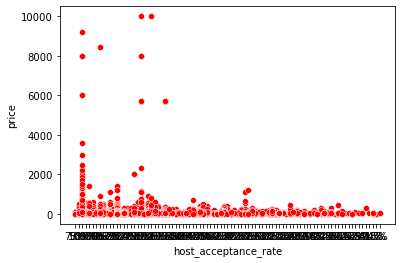

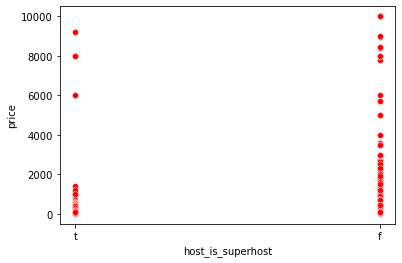

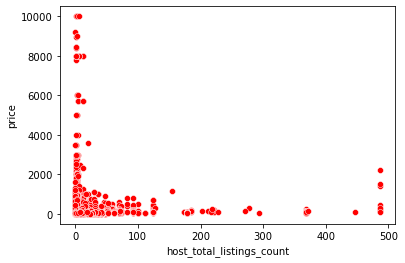

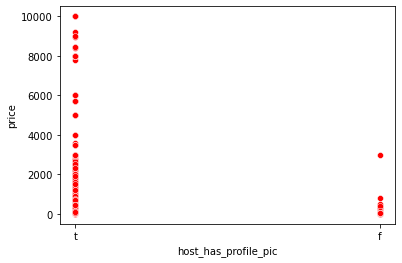

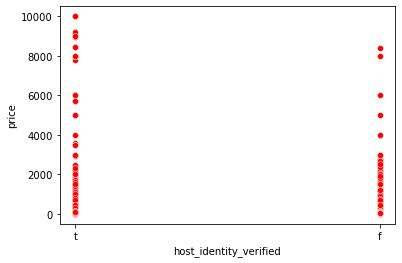

...

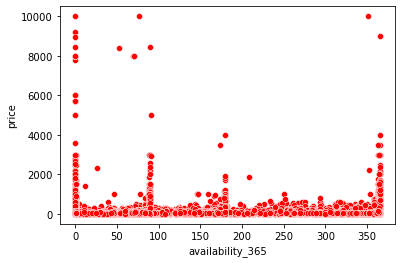

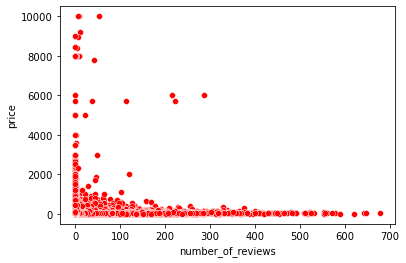

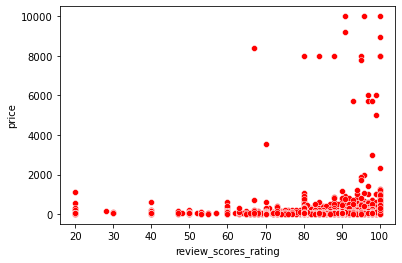

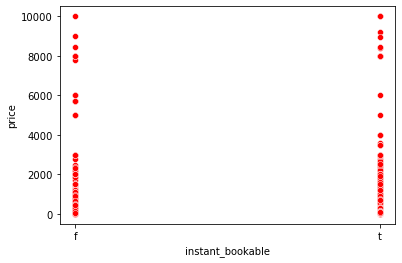

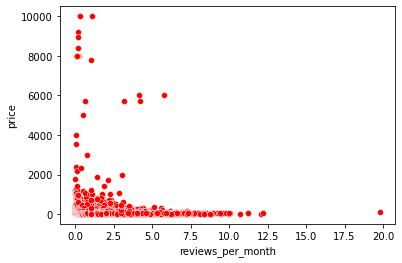

In [149]:
for i in df1.columns:
    sns.scatterplot(x = df1[i], y =df1.price, color="r")
    plt.show()

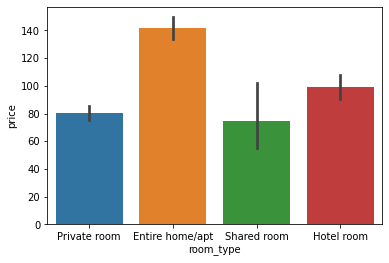

In [116]:
sns.barplot(x="room_type", y="price", data=df1) #mean price per room type
plt.show()

In [161]:
df1 = df1.rename(columns={"neighbourhood_group_cleansed":"area"}) #rename columns 

C:\Users\zhuzh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Precio', ylabel='Density'>

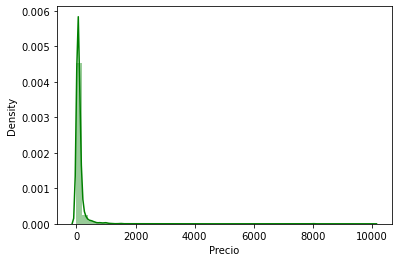

In [118]:
sns.distplot(df1["price"], axlabel="Precio", color="green")

<AxesSubplot:xlabel='area', ylabel='price'>

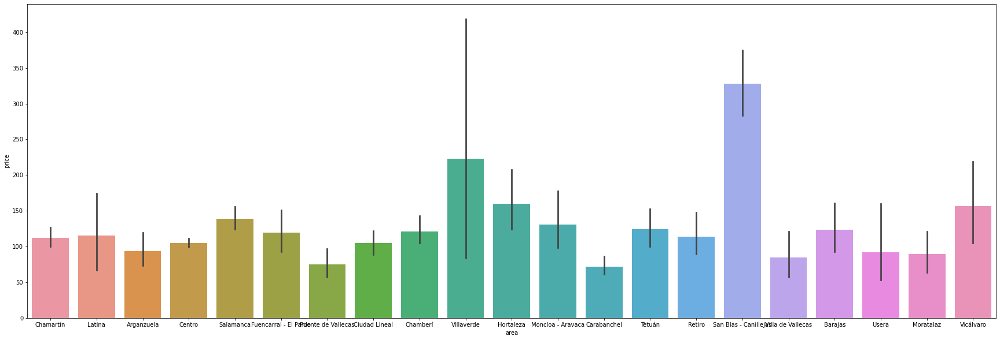

In [120]:
plt.figure(figsize=(30,10))
sns.barplot(x="area", y="price", data=df1) 

In [152]:
df1['beds'].value_counts()

Series([], Name: beds, dtype: int64)

In [154]:
df1['beds'] = df['beds']

In [122]:
pd.set_option('display.max_rows', None)

In [155]:
df1['beds']

0         1.0
1         1.0
2         5.0
3         1.0
4         3.0
5         1.0
6         2.0
7         1.0
8         3.0
9         2.0
10        3.0
11        2.0
12        1.0
13        2.0
14        2.0
15        1.0
16        3.0
17        2.0
18        6.0
19        2.0
20        2.0
21        1.0
22        1.0
23        3.0
24        3.0
25        1.0
26        2.0
27        2.0
28        1.0
29        1.0
30        1.0
31        2.0
32        3.0
33        2.0
34        1.0
35        2.0
36        1.0
37        2.0
38        4.0
39        1.0
40        1.0
41        1.0
42        3.0
43        2.0
44        1.0
45        4.0
46        4.0
47        1.0
48        1.0
49        2.0
50        3.0
51        1.0
52        1.0
53        NaN
54        1.0
55        1.0
56        1.0
57        7.0
58        1.0
59        0.0
60        1.0
61        1.0
62        1.0
63        6.0
64        1.0
65        6.0
66        2.0
67        1.0
68        1.0
69        0.0
70        1.0
71    

In [157]:
df1['beds'] = df1['beds'].replace({9:8, 10:8, 11:8, 12:8, 13:8, 14:8, 15:8, 16:8, 17:8, 18:8, 20:8, 21:8, 22:8, 23:8, 24:8, 44:8, 50:8})

In [158]:
df1['beds'].value_counts()

1.0    9302
2.0    5133
3.0    2561
4.0    1300
0.0     602
5.0     494
6.0     251
8.0     213
7.0      86
Name: beds, dtype: int64

In [126]:
df1.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
0,73%,t,1.0,t,t,Chamartín,Private room,2,1 shared bath,1.0,1.0,60.0,1,1125,t,90,78,98.0,f,0.59
1,NaN,f,2.0,t,t,Latina,Private room,1,1 bath,1.0,1.0,31.0,4,40,t,364,33,92.0,f,0.44
2,50%,f,8.0,t,t,Arganzuela,Entire home/apt,6,2 baths,3.0,5.0,60.0,8,730,t,292,0,NaN,f,NaN
3,100%,f,1.0,t,t,Centro,Entire home/apt,3,1 bath,NaN,1.0,101.0,5,730,t,88,8,98.0,f,0.14
4,100%,t,1.0,t,f,Centro,Entire home/apt,4,1.5 baths,2.0,3.0,115.0,3,8,t,358,68,98.0,f,0.58


In [128]:
df1['bedrooms'].value_counts()

1.0    13053
2.0     3901
3.0     1319
4.0      338
5.0      115
6.0       33
8.0       24
7.0       10
Name: bedrooms, dtype: int64

In [164]:
serie = df1.groupby("area")["price"].mean()
serie1 = df.groupby('neighbourhood_group_cleansed')["latitude"].mean()
serie2 = df.groupby('neighbourhood_group_cleansed')["longitude"].mean()
df2 = pd.DataFrame({"Price":serie,"Latitud":serie1,"Longitud":serie2})
df2.reset_index(inplace=True)

In [170]:
df2

,index,Price,Latitud,Longitud
0,Arganzuela,93.949033,40.401387,-3.699074
1,Barajas,123.514286,40.466354,-3.586642
2,Carabanchel,71.936464,40.387792,-3.730080
3,Centro,104.904846,40.416826,-3.703927
4,Chamartín,111.937815,40.450914,-3.677881
5,Chamberí,121.180315,40.435166,-3.703873
6,Ciudad Lineal,105.112260,40.436818,-3.649947
7,Fuencarral - El Pardo,119.574468,40.487206,-3.705382
8,Hortaleza,160.047753,40.473185,-3.645848
9,Latina,115.570707,40.401662,-3.745144


In [166]:
import folium
Latitud= 40.42071093543832
Longitud= -3.700319687355299
Madrid_map1 = folium.Map(location=[Latitud, Longitud], zoom_start=12)

Madrid_map1


In [169]:
points = df[["latitude","longitude"]].values

for lat, lng, label in zip(df2.Latitud,df2.Longitud,df2.index):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label
    ).add_to(Madrid_map1)
    
    
folium.Choropleth(
    geo_data="madrid.json",
    data=df2,
    columns=['index', 'Price'],
    key_on='feature.properties.name',
    fill_color='Reds', 
).add_to(Madrid_map1)



Madrid_map1


In [173]:
df1[df1['area']=='San Blas - Canillejas'].max()

host_is_superhost                                t
host_total_listings_count                       33
host_has_profile_pic                             t
host_identity_verified                           t
area                         San Blas - Canillejas
room_type                              Shared room
accommodates                                    10
bedrooms                                         5
beds                                             8
price                                         3500
minimum_nights                                 100
maximum_nights                                1125
has_availability                                 t
availability_365                               365
number_of_reviews                              454
review_scores_rating                           100
instant_bookable                                 t
reviews_per_month                             8.81
dtype: object

In [175]:
df1.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
0,73%,t,1.0,t,t,Chamartín,Private room,2,1 shared bath,1.0,1.0,60.0,1,1125,t,90,78,98.0,f,0.59
1,NaN,f,2.0,t,t,Latina,Private room,1,1 bath,1.0,1.0,31.0,4,40,t,364,33,92.0,f,0.44
2,50%,f,10.0,t,t,Arganzuela,Entire home/apt,6,2 baths,3.0,5.0,60.0,15,730,t,292,0,NaN,f,NaN
3,100%,f,1.0,t,t,Centro,Entire home/apt,3,1 bath,NaN,1.0,101.0,5,730,t,88,10,98.0,f,0.14
4,100%,t,1.0,t,f,Centro,Entire home/apt,4,1.5 baths,2.0,3.0,115.0,3,10,t,358,68,98.0,f,0.58


##create a new dataset only for entire home

In [286]:
df2 = df1[df1['room_type']=='Entire home/apt']

In [177]:
df2.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
2,50%,f,10.0,t,t,Arganzuela,Entire home/apt,6,2 baths,3.0,5.0,60.0,15,730,t,292,0,NaN,f,NaN
3,100%,f,1.0,t,t,Centro,Entire home/apt,3,1 bath,NaN,1.0,101.0,5,730,t,88,10,98.0,f,0.14
4,100%,t,1.0,t,f,Centro,Entire home/apt,4,1.5 baths,2.0,3.0,115.0,3,10,t,358,68,98.0,f,0.58
6,89%,f,3.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,2.0,65.0,5,180,t,365,170,93.0,f,1.34
7,NaN,f,1.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,1.0,54.0,3,730,t,0,8,88.0,f,0.12


C:\Users\zhuzh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='price'>

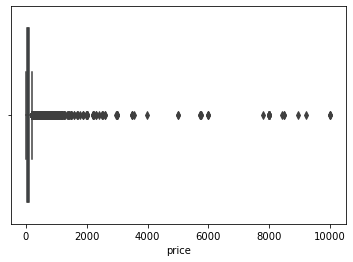

In [178]:
sns.boxplot(df2['price'])

In [179]:
df2.describe()

,host_total_listings_count,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating,reviews_per_month
count,11783.000000,11787.000000,10606.000000,11747.000000,11787.000000,11787.000000,1.178700e+04,11787.000000,11787.000000,8866.000000,8985.000000
mean,17.364423,4.077034,1.695173,2.362816,141.472130,6.419954,1.115574e+04,154.765589,39.737083,92.489962,1.364922
std,50.745240,1.924902,0.902795,1.415528,425.005311,28.399461,1.028513e+06,145.721764,69.214603,9.437057,1.458834
min,0.000000,1.000000,1.000000,0.000000,9.000000,1.000000,1.000000e+00,0.000000,0.000000,20.000000,0.010000
25%,1.000000,3.000000,1.000000,1.000000,55.000000,1.000000,2.000000e+02,0.000000,1.000000,90.000000,0.260000
50%,2.000000,4.000000,1.000000,2.000000,79.000000,2.000000,1.125000e+03,127.000000,8.000000,95.000000,0.830000
75%,10.000000,5.000000,2.000000,3.000000,120.000000,3.000000,1.125000e+03,323.000000,49.000000,98.000000,2.030000
max,486.000000,16.000000,10.000000,8.000000,9999.000000,1125.000000,1.111111e+08,365.000000,678.000000,100.000000,11.250000


In [287]:
p = df1['price'].mean() + df1['price'].std()*2 
p

824.762699931467

In [288]:
df2low = df2[df2['price']<p]
df2high = df2[df2['price']>p]

Identify outliers - we have filtered the values that are higher than mean + std*2 

In [187]:
df2low.describe()

,host_total_listings_count,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating,reviews_per_month
count,11605.000000,11609.000000,10440.000000,11570.000000,11609.000000,11609.000000,1.160900e+04,11609.000000,11609.000000,8821.000000,8935.000000
mean,17.445842,4.063744,1.687069,2.355661,105.803428,6.266431,1.131708e+04,155.021449,40.194504,92.491668,1.367288
std,50.523534,1.912157,0.889781,1.409728,96.254804,24.776091,1.036368e+06,145.601324,69.505113,9.414086,1.459468
min,0.000000,1.000000,1.000000,0.000000,9.000000,1.000000,1.000000e+00,0.000000,0.000000,20.000000,0.010000
25%,1.000000,3.000000,1.000000,1.000000,55.000000,1.000000,2.000000e+02,0.000000,1.000000,90.000000,0.260000
50%,2.000000,4.000000,1.000000,2.000000,78.000000,2.000000,1.125000e+03,130.000000,9.000000,95.000000,0.830000
75%,11.000000,5.000000,2.000000,3.000000,119.000000,3.000000,1.125000e+03,322.000000,49.000000,98.000000,2.040000
max,486.000000,16.000000,10.000000,8.000000,821.000000,999.000000,1.111111e+08,365.000000,678.000000,100.000000,11.250000


In [188]:
df2low.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11609 entries, 2 to 20350
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   host_acceptance_rate       9285 non-null   object 
 1   host_is_superhost          11605 non-null  object 
 2   host_total_listings_count  11605 non-null  float64
 3   host_has_profile_pic       11605 non-null  object 
 4   host_identity_verified     11605 non-null  object 
 5   area                       11609 non-null  object 
 6   room_type                  11609 non-null  object 
 7   accommodates               11609 non-null  int64  
 8   bathrooms_text             11605 non-null  object 
 9   bedrooms                   10440 non-null  float64
 10  beds                       11570 non-null  float64
 11  price                      11609 non-null  float64
 12  minimum_nights             11609 non-null  int64  
 13  maximum_nights             11609 non-null  int

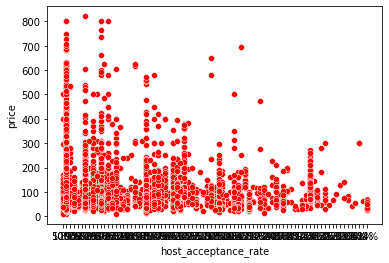

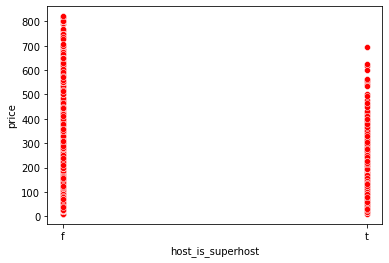

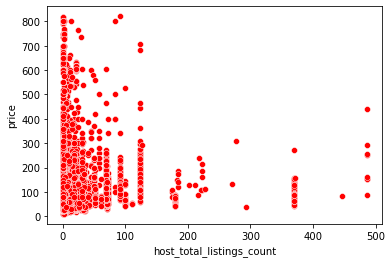

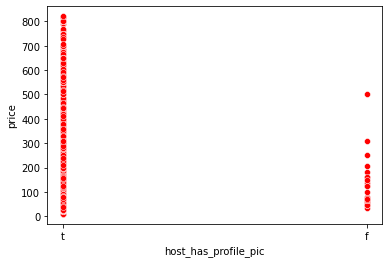

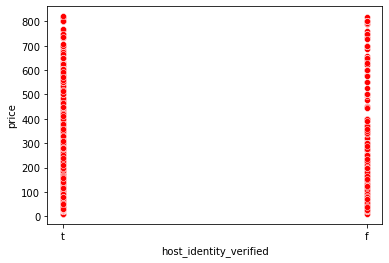

...

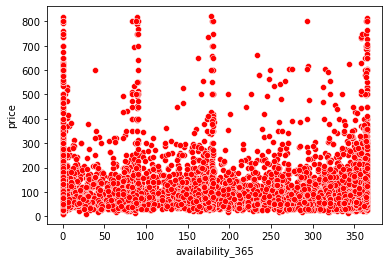

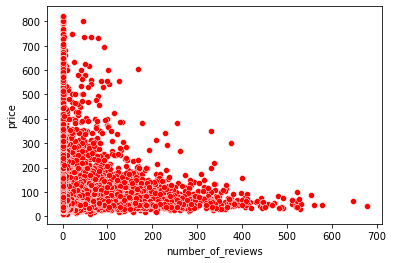

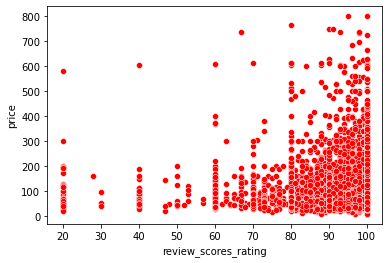

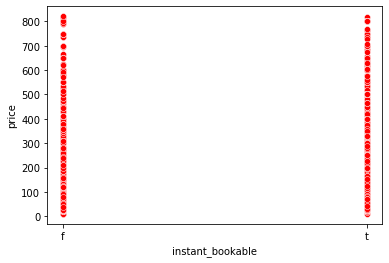

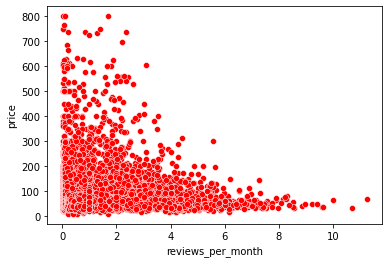

In [189]:
for i in df2low.columns:
    sns.scatterplot(x = df2low[i], y =df2low.price, color="r")
    plt.show()

We can see that there are many outliers in Vicalvaro, we will leave it teh way it is for now 

<AxesSubplot:xlabel='area', ylabel='price'>

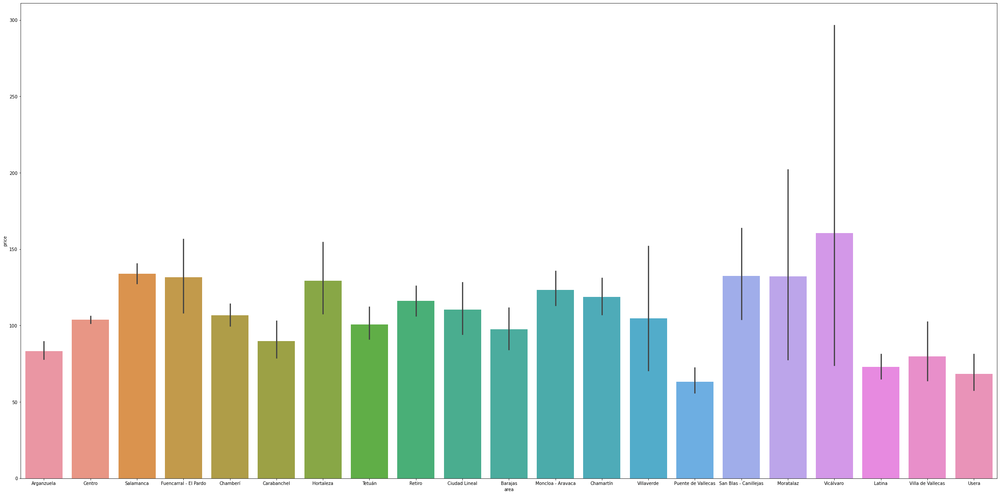

In [192]:
plt.figure(figsize=(40,20))
sns.barplot(x="area", y="price", data=df2low) 

## Dataset cleaning

group beds by number, all higher than 8 in 1 group
group bedrooms by number, more than 4 in 1 group
price has a lot of outliers, we have centered in prices lower than mean + 2*std
changed host acceptance rate to number and replace nans with mean
removed rows with beds nulls
replace bedrooms with 0 where is null
replace review_scores_rating with -1 
reviews_per_month with 0
bathroom text remove baths and convert to float, group by number of bathrooms
group accommodates 
change t f to 1 0 

In [195]:
df2low.isnull().sum()/len(df2low)*100

host_acceptance_rate         20.018951
host_is_superhost             0.034456
host_total_listings_count     0.034456
host_has_profile_pic          0.034456
host_identity_verified        0.034456
area                          0.000000
room_type                     0.000000
accommodates                  0.000000
bathrooms_text                0.034456
bedrooms                     10.069773
beds                          0.335946
price                         0.000000
minimum_nights                0.000000
maximum_nights                0.000000
has_availability              0.000000
availability_365              0.000000
number_of_reviews             0.000000
review_scores_rating         24.015850
instant_bookable              0.000000
reviews_per_month            23.033853
dtype: float64

In [234]:
df2low['host_acceptance_rate'].value_counts()

100%    5018
99%      774
98%      486
0%       256
97%      208
        ... 
52%        1
47%        1
16%        1
35%        1
32%        1
Name: host_acceptance_rate, Length: 81, dtype: int64

In [215]:
df2low.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
2,0.50,f,10.0,t,t,Arganzuela,Entire home/apt,6,2 baths,3.0,5.0,60.0,15,730,t,292,0,NaN,f,NaN
3,1.00,f,1.0,t,t,Centro,Entire home/apt,3,1 bath,NaN,1.0,101.0,5,730,t,88,10,98.0,f,0.14
4,1.00,t,1.0,t,f,Centro,Entire home/apt,4,1.5 baths,2.0,3.0,115.0,3,10,t,358,68,98.0,f,0.58
6,0.89,f,3.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,2.0,65.0,5,180,t,365,170,93.0,f,1.34
7,NaN,f,1.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,1.0,54.0,3,730,t,0,8,88.0,f,0.12


In [290]:
df2low['host_acceptance_rate'] = df2low['host_acceptance_rate'].str.rstrip('%').astype('float') / 100.0


<ipython-input-290-156fdac230e4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2low['host_acceptance_rate'] = df2low['host_acceptance_rate'].str.rstrip('%').astype('float') / 100.0


In [291]:
df2low['host_acceptance_rate'] = df2low['host_acceptance_rate'].replace(np.nan,df2low['host_acceptance_rate'].mean() )
#replace nans with the mean

<ipython-input-291-9a52da2ed356>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2low['host_acceptance_rate'] = df2low['host_acceptance_rate'].replace(np.nan,df2low['host_acceptance_rate'].mean() )


In [292]:
df2low['host_acceptance_rate'].mean()

0.8815993537964089

In [293]:
df2low.isnull().sum()

host_acceptance_rate            0
host_is_superhost               4
host_total_listings_count       4
host_has_profile_pic            4
host_identity_verified          4
area                            0
room_type                       0
accommodates                    0
bathrooms_text                  4
bedrooms                     1169
beds                           39
price                           0
minimum_nights                  0
maximum_nights                  0
has_availability                0
availability_365                0
number_of_reviews               0
review_scores_rating         2788
instant_bookable                0
reviews_per_month            2674
dtype: int64

In [246]:
pd.set_option('display.max_rows', 30)

In [294]:
df2low['bedrooms'].value_counts()

1.0     5412
2.0     3458
3.0     1179
4.0      270
5.0       85
6.0       20
7.0        9
8.0        4
9.0        2
10.0       1
Name: bedrooms, dtype: int64

In [240]:
# df2low['bedrooms'] = df2low['bedrooms'].replace({5:4,6:4,7:4,8:4,9:4,10:4}) #group bedrooms

<ipython-input-240-b0210ba4d18f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2low['bedrooms'] = df2low['bedrooms'].replace({5:4,6:4,7:4,8:4,9:4,10:4}) #group bedrooms


In [226]:
int(df2low['bedrooms'].mean())

1

In [227]:
df2low['bedrooms'].value_counts()

1.0    5412
2.0    3458
3.0    1179
4.0     391
Name: bedrooms, dtype: int64

In [295]:
df2low['bedrooms'].mean()

1.6870689655172413

In [257]:
df2low.head(20)

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
2,0.500000,f,10.0,t,t,Arganzuela,Entire home/apt,6,2 baths,3.0,5.0,60.0,15,730,t,292,0,NaN,f,NaN
3,1.000000,f,1.0,t,t,Centro,Entire home/apt,3,1 bath,0.0,1.0,101.0,5,730,t,88,10,98.0,f,0.14
4,1.000000,t,1.0,t,f,Centro,Entire home/apt,4,1.5 baths,2.0,3.0,115.0,3,10,t,358,68,98.0,f,0.58
6,0.890000,f,3.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,2.0,65.0,5,180,t,365,170,93.0,f,1.34
7,0.881599,f,1.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,1.0,54.0,3,730,t,0,8,88.0,f,0.12
9,1.000000,t,17.0,t,t,Centro,Entire home/apt,4,1 bath,1.0,2.0,81.0,3,500,t,1,120,93.0,t,1.75
10,0.890000,f,3.0,t,f,Centro,Entire home/apt,3,1 bath,1.0,3.0,90.0,5,180,t,365,48,93.0,t,0.39
11,0.881599,f,1.0,t,t,Salamanca,Entire home/apt,3,2 baths,2.0,2.0,82.0,10,999,t,362,55,97.0,f,0.45
15,1.000000,t,3.0,t,t,Centro,Entire home/apt,2,1 bath,1.0,1.0,61.0,5,1125,t,1,50,97.0,f,1.49
16,1.000000,f,6.0,t,t,Centro,Entire home/apt,4,1 bath,1.0,3.0,56.0,28,360,t,1,20,83.0,t,0.17


In [296]:
#remove the rows with nans in beds
df2low = df2low[~df2low['beds'].isna()]

In [297]:
df3 = df2low.copy()
df2low['beds'].dropna(axis=0, inplace = True)

In [253]:
df2low.isnull().sum()

host_acceptance_rate            0
host_is_superhost               4
host_total_listings_count       4
host_has_profile_pic            4
host_identity_verified          4
area                            0
room_type                       0
accommodates                    0
bathrooms_text                  2
bedrooms                     1159
beds                            0
price                           0
minimum_nights                  0
maximum_nights                  0
has_availability                0
availability_365                0
number_of_reviews               0
review_scores_rating         2760
instant_bookable                0
reviews_per_month            2646
dtype: int64

In [298]:
df2low['bedrooms'] = df2low['bedrooms'].replace(np.nan, 0)
#replace nans in bedrooms with 0 

In [299]:
df2low.isnull().sum()

host_acceptance_rate            0
host_is_superhost               4
host_total_listings_count       4
host_has_profile_pic            4
host_identity_verified          4
area                            0
room_type                       0
accommodates                    0
bathrooms_text                  2
bedrooms                        0
beds                            0
price                           0
minimum_nights                  0
maximum_nights                  0
has_availability                0
availability_365                0
number_of_reviews               0
review_scores_rating         2760
instant_bookable                0
reviews_per_month            2646
dtype: int64

In [300]:
df2low['review_scores_rating'] = df2low['review_scores_rating'].replace(np.nan, -1 )

In [301]:
df2low['reviews_per_month'] = df2low['reviews_per_month'].replace(np.nan, 0 )

In [302]:
df3 = df2low.copy()
df2low.dropna(axis=0, inplace = True)

In [263]:
df2low.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
2,0.500000,f,10.0,t,t,Arganzuela,Entire home/apt,6,2 baths,3.0,5.0,60.0,15,730,t,292,0,-1.0,f,0.00
3,1.000000,f,1.0,t,t,Centro,Entire home/apt,3,1 bath,0.0,1.0,101.0,5,730,t,88,10,98.0,f,0.14
4,1.000000,t,1.0,t,f,Centro,Entire home/apt,4,1.5 baths,2.0,3.0,115.0,3,10,t,358,68,98.0,f,0.58
6,0.890000,f,3.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,2.0,65.0,5,180,t,365,170,93.0,f,1.34
7,0.881599,f,1.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,1.0,54.0,3,730,t,0,8,88.0,f,0.12


In [ ]:
#group bedrooms

In [303]:
df2low['bedrooms'].value_counts()

1.0     5391
2.0     3449
3.0     1177
0.0     1159
4.0      268
5.0       84
6.0       20
7.0        9
8.0        4
9.0        2
10.0       1
Name: bedrooms, dtype: int64

In [304]:
df2low['bedrooms'] = df2low['bedrooms'].replace({5:4,6:4,7:4,8:4,9:4,10:4})

In [ ]:
#group bathrooms

In [311]:
df2low['bathrooms_text'].value_counts()

1 bath       8182
2 baths      2088
1.5 baths     738
3 baths       239
2.5 baths     167
4 baths        50
3.5 baths      33
0 baths        17
4.5 baths      17
5 baths        14
Half-bath       5
7 baths         4
6 baths         4
5.5 baths       3
10 baths        2
6.5 baths       1
Name: bathrooms_text, dtype: int64

In [331]:
df3['bathrooms_text'] = df3['bathrooms_text'].replace('Half-bath', '0.5 baths')

In [309]:
df3 = df2low.copy()

In [332]:
df3.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
2,0.500000,f,10.0,t,t,Arganzuela,Entire home/apt,6,2 baths,3.0,5.0,60.0,15,730,t,292,0,-1.0,f,0.00
3,1.000000,f,1.0,t,t,Centro,Entire home/apt,3,1 bath,0.0,1.0,101.0,5,730,t,88,10,98.0,f,0.14
4,1.000000,t,1.0,t,f,Centro,Entire home/apt,4,1.5 baths,2.0,3.0,115.0,3,10,t,358,68,98.0,f,0.58
6,0.890000,f,3.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,2.0,65.0,5,180,t,365,170,93.0,f,1.34
7,0.881599,f,1.0,t,f,Centro,Entire home/apt,2,1 bath,1.0,1.0,54.0,3,730,t,0,8,88.0,f,0.12


In [333]:
lista = []
for i in df3['bathrooms_text']:
    print(i.split('bath')[0])
    lista.append(i.split('bath')[0])

2 
1 
1.5 
1 
1 
1 
1 
2 
1 
1 
1 
1.5 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
2.5 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
2 
1 
1 
1 
0.5 
1 
1 
1.5 
1 
1 
1 
1 
1 
1 
1 
2 
2 
1 
1 
1 
4 
1 
2 
1 
1 
1 
1 
1 
1 
2 
2 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1.5 
2 
1.5 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1.5 
1 
1 
1 
1.5 
1 
1 
1 
1.5 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
2 
2 
2 
1 
1.5 
1 
1 
2 
1 
3 
1 
1 
1 
3 
2 
2 
1 
1 
1 
1 
1 
1.5 
1 
2 
1 
2 
1.5 
3 
1 
2 
2 
2 
1 
1 
1 
1 
1 
2.5 
1 
1 
1 
2 
1 
1 
1 
2 
2 
1 
1 
1 
1 
1 
1.5 
1 
2 
1 
1 
2 
1 
3.5 
1 
2 
1 
1 
1 
1 
1 
1.5 
1 
1 
1 
2.5 
1 
1 
2 
1 
1 
2 
1 
1 
2 
1 
1 
1 
1 
1 
2 
1 
1 
1.5 
1 
1 
1 
1 
1.5 
2 
1 
1 
1 
1.5 
2 
1.5 
1 
1 
1 
1 
1 
1 
1 
2.5 
2 
1.5 
1 
1 
1 
5 
1 
1 
2 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1

1 
1 
1 
2 
1 
1.5 
1 
1 
1.5 
1 
1 
1 
1 
1 
1 
1.5 
2 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
2 
1 
2 
1 
2 
1 
1 
1 
1 
1 
1 
1.5 
1 
1 
1 
1 
2 
2 
1 
2.5 
1 
1.5 
1.5 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
3 
1 
1 
2 
2 
2 
1 
1 
2.5 
1 
2 
1 
2 
2 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
2 
2 
1 
1 
1 
1 
1 
1 
1 
2 
2 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1.5 
1 
2 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
2 
1 
2 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
3 
1 
3 
1 
1 
1 
1 
2 
1 
1 
2 
1 
2.5 
1 
1 
2 
1 
1 
1 
1 
2 
1 
1 
1.5 
1 
1 
1 
1.5 
1 
1 
1 
1 
2 
1 
1.5 
1 
1 
1.5 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
2 
1 
1.5 
1 
1 
1 
2 
2 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
3.5 
2 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
2 
2.5 
1 
1 
1 
1 
2 
2 
1 
1 
1 
1 
1.5 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
3 
2 
1 
1.5 
1 
1 
3.5 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
2 
2 
2 
2 
1 
2 
2 
2 
2 
2 
1 
2 
2 
2.5 
1 
1 
1 
2 
1 
1 
1 
2 
2 
2 
2 
2 
1 
2 
1 
1 
1 
2 
2 
2 
1.5 
1 
2 
1 

1 
2 
1 
1 
1 
2 
2 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1.5 
3 
2 
1 
1 
1 
2 
2 
1 
2 
1 
1 
1 
3 
1 
1 
1 
3.5 
1 
1.5 
1 
1 
1 
2 
2 
1 
1 
1 
2 
1 
1 
2 
1 
1 
2 
1 
1 
1 
1 
2 
2 
1 
2 
2 
1.5 
1.5 
1 
1 
1 
1 
1.5 
1 
1.5 
2 
2 
1 
1 
1 
1 
1 
1.5 
1 
1 
1 
1 
1 
1 
2 
1 
1 
3 
2 
2 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
2 
1 
1 
1.5 
2 
2 
2 
2 
1 
3 
2 
2 
2 
1 
2 
1 
2 
1 
1 
2 
3 
3 
3 
1 
2 
1 
1 
1 
1 
2 
1 
1 
2 
2 
2 
2 
2 
2 
1.5 
1 
2 
1 
2 
1 
1.5 
1 
1.5 
1.5 
1 
2 
1 
2 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1.5 
1 
2 
1 
2 
1 
1 
1 
1 
2 
1 
2 
2 
1 
2 
1 
2 
1 
1 
1 
2 
1 
1 
1 
1 
1.5 
4 
2 
1 
2 
1 
1 
1 
1 
1 
4.5 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
2 
1 
1 
2 
4.5 
1.5 
1 
1 
1 
1 
2 
1 
2 
1.5 
2 
1 
1 
1 
1.5 
1 
1 
1.5 
1 
1 
2 
2 
1 
2 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
3 
1 
1 
1 
1 
1 
1 
2 
1 
2 
1 
1 
1 
1 
2 
1 
1.5 
1 
2 
1.5 
2 
1 
1 
1 
1 
1 
1.5 
1 
1 
2.5 
1 
1 
1 
1.5 
1 
1 
1 
1 
2 
1 
2 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1 


1 
1 
2 
2 
1 
1 
1 
1 
1 
2 
1 
1 
1 
4 
1 
1 
2.5 
2 
1 
1 
2 
1.5 
1 
2 
1 
2 
2.5 
2 
1 
1 
0 
1 
2 
1 
1 
1 
1 
1 
1 
2 
1 
4 
1 
1 
1 
1 
2 
1 
1.5 
2 
2 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
2 
1 
1 
2 
1 
1 
3 
1.5 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
4 
1 
2 
1 
2 
1 
2 
1 
1 
1 
1 
1 
1 
2 
3 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1.5 
1 
1 
2 
1 
1 
4 
1 
1 
1 
1 
1 
2 
1 
1 
1.5 
1 
0 
1 
1 
1 
1 
1 
1 
2 
1 
2 
1 
1 
1 
1 
1 
1 
1 
3 
2 
1.5 
2 
1 
1 
1 
1 
1 
1 
1 
3.5 
1 
2 
2 
1 
1 
1 
1.5 
1 
2 
1 
1 
2 
2 
1.5 
1 
1 
1 
1 
1 
1 
1 
1 
1.5 
1 
1 
1 
1 
2 
1 
1 
1 
1 
1 
1.5 
1 
1 
1 
1 
1.5 
1 
2 
1 
1 
1 
1 
1 
1 
2 
1 
1 
1.5 
1 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1.5 
1.5 
1 
1 
1 
2 
1 
1 
2 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1.5 
1 
1 
1 
1 
1 
2 
1 
2 
2 
1 
1 
1 
1 
1 
2.5 
1 
1 
1 
1 
3 
1 
2 
1.5 
1 
1 
1 
1 
2 
2 
1 
3 
2 
1.5 
1 
1 
1 
1 
1 
1 
1 
1.5 
1 
1 
2 
2 
1 
1 
1 
1 
1 
1 
1 
2 
1 
2 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1 
1.5 
2 
1 
1.5 
1 
1 
2

In [334]:
lista

['2 ',
 '1 ',
 '1.5 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '1.5 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '2.5 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '1 ',
 '1 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '0.5 ',
 '1 ',
 '1 ',
 '1.5 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '4 ',
 '1 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '2 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1.5 ',
 '2 ',
 '1.5 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1.5 ',
 '1 ',
 '1 ',
 '1 ',
 '1.5 ',
 '1 ',
 '1 ',
 '1 ',
 '1.5 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '1 ',
 '2 ',
 '2 ',
 '2 ',
 '1 ',


In [335]:
df3['bathrooms_text'] = lista

In [338]:
df3['bathrooms_text']  =df3['bathrooms_text'].astype('float64')

In [339]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11564 entries, 2 to 20350
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   host_acceptance_rate       11564 non-null  float64
 1   host_is_superhost          11564 non-null  object 
 2   host_total_listings_count  11564 non-null  float64
 3   host_has_profile_pic       11564 non-null  object 
 4   host_identity_verified     11564 non-null  object 
 5   area                       11564 non-null  object 
 6   room_type                  11564 non-null  object 
 7   accommodates               11564 non-null  int64  
 8   bathrooms_text             11564 non-null  float64
 9   bedrooms                   11564 non-null  float64
 10  beds                       11564 non-null  float64
 11  price                      11564 non-null  float64
 12  minimum_nights             11564 non-null  int64  
 13  maximum_nights             11564 non-null  int

In [348]:
df3['bathrooms_text'].value_counts()

1.0    8187
2.0    2826
3.0     534
0.0      17
Name: bathrooms_text, dtype: int64

In [345]:
df3["bathrooms_text"]=df3["bathrooms_text"].replace({0.5:1,1.5:2,2.5:3,3.5:4,4.5:4,5:4,5.5:4,6:4,6.5:4,7:4,10:4})

In [347]:
df3["bathrooms_text"]=df3["bathrooms_text"].replace({4:3})

In [341]:
df3.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
2,0.500000,f,10.0,t,t,Arganzuela,Entire home/apt,6,2.0,3.0,5.0,60.0,15,730,t,292,0,-1.0,f,0.00
3,1.000000,f,1.0,t,t,Centro,Entire home/apt,3,1.0,0.0,1.0,101.0,5,730,t,88,10,98.0,f,0.14
4,1.000000,t,1.0,t,f,Centro,Entire home/apt,4,1.5,2.0,3.0,115.0,3,10,t,358,68,98.0,f,0.58
6,0.890000,f,3.0,t,f,Centro,Entire home/apt,2,1.0,1.0,2.0,65.0,5,180,t,365,170,93.0,f,1.34
7,0.881599,f,1.0,t,f,Centro,Entire home/apt,2,1.0,1.0,1.0,54.0,3,730,t,0,8,88.0,f,0.12


In [342]:
df3['host_is_superhost'] = df3['host_is_superhost'].replace({'f':0, 't':1}) #replace superhost 

In [344]:
df3['host_has_profile_pic'] = df3['host_has_profile_pic'].replace({'f':0, 't':1}) #replace host profile

In [343]:
df3['host_identity_verified'] = df3['host_identity_verified'].replace({'f':0, 't':1}) # replace host_identity_verified

In [350]:
df3["accommodates"]= df3["accommodates"].replace({1:3,2:3,5:4,6:4,7:4,8:4,9:4,10:4,11:4,12:4,13:4,14:4,15:4,16:4})


In [349]:
df3.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
2,0.500000,0,10.0,1,1,Arganzuela,Entire home/apt,6,2.0,3.0,5.0,60.0,15,730,t,292,0,-1.0,f,0.00
3,1.000000,0,1.0,1,1,Centro,Entire home/apt,3,1.0,0.0,1.0,101.0,5,730,t,88,10,98.0,f,0.14
4,1.000000,1,1.0,1,0,Centro,Entire home/apt,4,2.0,2.0,3.0,115.0,3,10,t,358,68,98.0,f,0.58
6,0.890000,0,3.0,1,0,Centro,Entire home/apt,2,1.0,1.0,2.0,65.0,5,180,t,365,170,93.0,f,1.34
7,0.881599,0,1.0,1,0,Centro,Entire home/apt,2,1.0,1.0,1.0,54.0,3,730,t,0,8,88.0,f,0.12


In [351]:
df3['has_availability'] = df3['has_availability'].replace({'f':0, 't':1})
df3['instant_bookable'] = df3['instant_bookable'].replace({'f':0, 't':1})

In [372]:
df3.describe()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_365,number_of_reviews,review_scores_rating,instant_bookable,reviews_per_month
count,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000,1.156400e+04,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000,11564.000000
mean,0.881751,0.216188,17.488412,0.997319,0.796005,3.640090,1.335265,1.502248,2.355673,105.891819,6.212643,1.135786e+04,0.998789,154.977689,40.345555,70.216361,0.556382,1.055915
std,0.221211,0.411662,50.602776,0.051709,0.402983,0.479995,0.564079,0.924876,1.408887,96.359453,24.436965,1.038382e+06,0.034775,145.556713,69.597529,40.675466,0.496832,1.405262
min,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,9.000000,1.000000,1.000000e+00,0.000000,0.000000,0.000000,-1.000000,0.000000,0.000000
25%,0.881599,0.000000,1.000000,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000,55.000000,1.000000,2.000000e+02,1.000000,0.000000,1.000000,60.000000,0.000000,0.040000
50%,0.980000,0.000000,2.000000,1.000000,1.000000,4.000000,1.000000,1.000000,2.000000,78.000000,2.000000,1.125000e+03,1.000000,130.000000,9.000000,92.000000,1.000000,0.440000
75%,1.000000,0.000000,11.000000,1.000000,1.000000,4.000000,2.000000,2.000000,3.000000,119.000000,3.000000,1.125000e+03,1.000000,322.000000,50.000000,97.000000,1.000000,1.600000
max,1.000000,1.000000,486.000000,1.000000,1.000000,4.000000,3.000000,4.000000,8.000000,821.000000,999.000000,1.111111e+08,1.000000,365.000000,678.000000,100.000000,1.000000,11.250000


<AxesSubplot:xlabel='area', ylabel='price'>

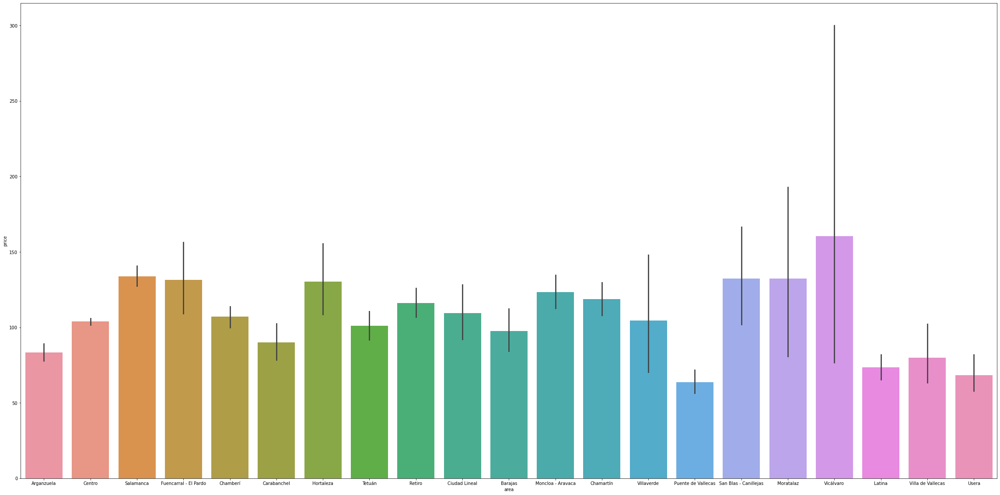

In [379]:
plt.figure(figsize=(40,20))
sns.barplot(x="area", y="price", data=df3) 

In [380]:
dummy1 = pd.get_dummies(df3['area'])

In [381]:
df3 = pd.concat([df3, dummy1], axis=1)

In [382]:
df3.head()

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,area,room_type,accommodates,bathrooms_text,bedrooms,...,Moratalaz,Puente de Vallecas,Retiro,Salamanca,San Blas - Canillejas,Tetuán,Usera,Vicálvaro,Villa de Vallecas,Villaverde
2,0.500000,0,10.0,1,1,Arganzuela,Entire home/apt,4,2.0,3.0,...,0,0,0,0,0,0,0,0,0,0
3,1.000000,0,1.0,1,1,Centro,Entire home/apt,3,1.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,1.000000,1,1.0,1,0,Centro,Entire home/apt,4,2.0,2.0,...,0,0,0,0,0,0,0,0,0,0
6,0.890000,0,3.0,1,0,Centro,Entire home/apt,3,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
7,0.881599,0,1.0,1,0,Centro,Entire home/apt,3,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0


In [384]:
dffinal = df3.copy()

In [386]:
del dffinal['area']

In [387]:
del dffinal['room_type']

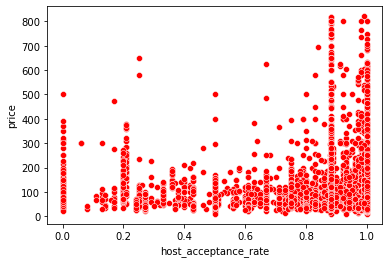

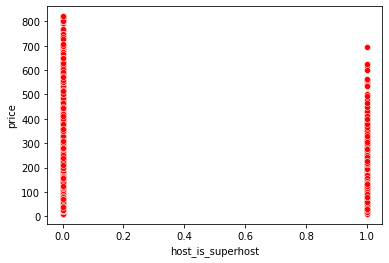

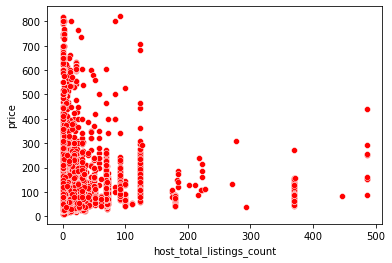

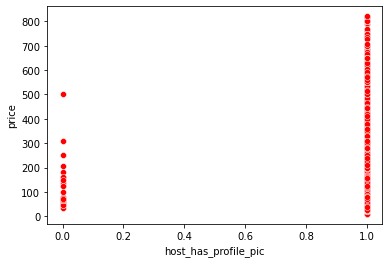

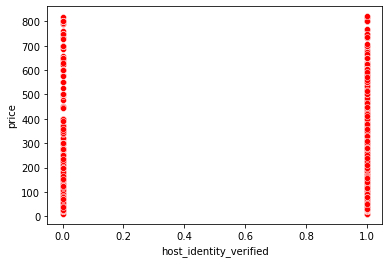

...

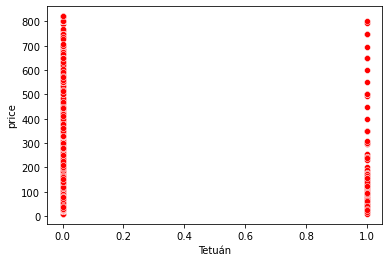

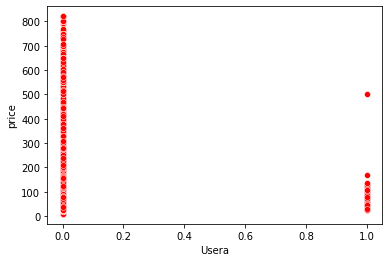

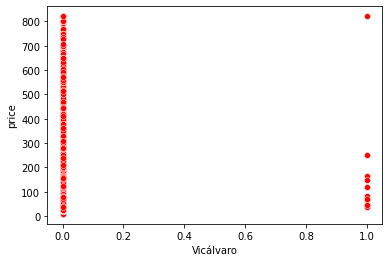

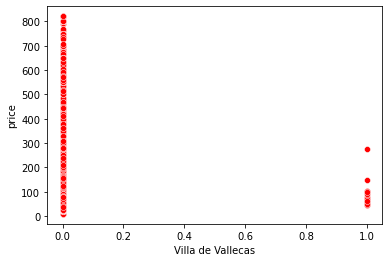

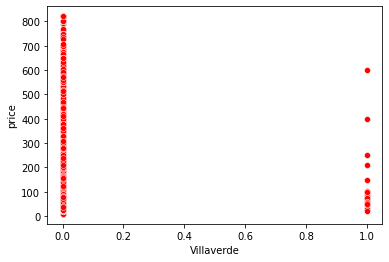

In [383]:
for i in df3.columns:
    sns.scatterplot(x = df3[i], y =df3.price, color="r")
    plt.show()

In [389]:
from sklearn.preprocessing import StandardScaler
objeto = StandardScaler()
objeto2 = objeto.fit_transform(dffinal)
dfnorm = pd.DataFrame(dffinal, columns = dffinal.columns)


In [390]:
dfnorm

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bathrooms_text,bedrooms,beds,price,...,Moratalaz,Puente de Vallecas,Retiro,Salamanca,San Blas - Canillejas,Tetuán,Usera,Vicálvaro,Villa de Vallecas,Villaverde
2,0.500000,0,10.0,1,1,4,2.0,3.0,5.0,60.0,...,0,0,0,0,0,0,0,0,0,0
3,1.000000,0,1.0,1,1,3,1.0,0.0,1.0,101.0,...,0,0,0,0,0,0,0,0,0,0
4,1.000000,1,1.0,1,0,4,2.0,2.0,3.0,115.0,...,0,0,0,0,0,0,0,0,0,0
6,0.890000,0,3.0,1,0,3,1.0,1.0,2.0,65.0,...,0,0,0,0,0,0,0,0,0,0
7,0.881599,0,1.0,1,0,3,1.0,1.0,1.0,54.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20343,0.881599,0,62.0,1,0,4,1.0,1.0,3.0,72.0,...,0,0,0,0,0,0,0,0,0,0
20347,0.380000,1,18.0,1,1,3,1.0,1.0,2.0,80.0,...,0,0,0,1,0,0,0,0,0,0
20348,0.881599,0,0.0,1,0,4,3.0,4.0,4.0,445.0,...,0,0,0,0,0,0,0,0,0,0
20349,0.860000,0,371.0,1,1,3,1.0,1.0,2.0,157.0,...,0,0,0,0,0,1,0,0,0,0


In [391]:
dffinal.columns

Index(['host_acceptance_rate', 'host_is_superhost',
       'host_total_listings_count', 'host_has_profile_pic',
       'host_identity_verified', 'accommodates', 'bathrooms_text', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights', 'has_availability',
       'availability_365', 'number_of_reviews', 'review_scores_rating',
       'instant_bookable', 'reviews_per_month', 'Arganzuela', 'Barajas',
       'Carabanchel', 'Centro', 'Chamartín', 'Chamberí', 'Ciudad Lineal',
       'Fuencarral - El Pardo', 'Hortaleza', 'Latina', 'Moncloa - Aravaca',
       'Moratalaz', 'Puente de Vallecas', 'Retiro', 'Salamanca',
       'San Blas - Canillejas', 'Tetuán', 'Usera', 'Vicálvaro',
       'Villa de Vallecas', 'Villaverde'],
      dtype='object')

In [402]:
X = dffinal[['host_acceptance_rate', 'host_is_superhost','host_total_listings_count', 'host_has_profile_pic','host_identity_verified', 'accommodates', 'bathrooms_text', 'bedrooms','beds', 'price', 'minimum_nights', 'maximum_nights', 'has_availability','availability_365', 'number_of_reviews', 'review_scores_rating','instant_bookable', 'reviews_per_month', 'Arganzuela', 'Barajas','Carabanchel', 'Centro', 'Chamartín', 'Chamberí', 'Ciudad Lineal','Fuencarral - El Pardo', 'Hortaleza', 'Latina', 'Moncloa - Aravaca','Moratalaz', 'Puente de Vallecas', 'Retiro', 'Salamanca','San Blas - Canillejas', 'Tetuán', 'Usera', 'Vicálvaro','Villa de Vallecas', 'Villaverde']].values
y = dffinal['price'].values

In [406]:
X2 = dffinal.loc[dffinal['area']=='Tetuán', 'host_acceptance_rate', 'host_is_superhost','host_total_listings_count', 'host_has_profile_pic','host_identity_verified', 'accommodates', 'bathrooms_text', 'bedrooms','beds', 'price', 'minimum_nights', 'maximum_nights', 'has_availability','availability_365', 'number_of_reviews', 'review_scores_rating','instant_bookable', 'reviews_per_month', 'Arganzuela', 'Barajas','Carabanchel', 'Centro', 'Chamartín', 'Chamberí', 'Ciudad Lineal','Fuencarral - El Pardo', 'Hortaleza', 'Latina', 'Moncloa - Aravaca','Moratalaz', 'Puente de Vallecas', 'Retiro', 'Salamanca','San Blas - Canillejas', 'Tetuán', 'Usera', 'Vicálvaro','Villa de Vallecas', 'Villaverde']
y2 = dffinal.loc[dffinal['area']=='Tetuán','price']

KeyError: 'area'

In [396]:
y

array([ 60., 101., 115., ..., 445., 157.,  36.])

In [397]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30) #cada vez es diferente

In [398]:
regresion_lineal = linear_model.LinearRegression()
regresion_lineal.fit(X_train, y_train)

LinearRegression()

In [399]:
yhat = regresion_lineal.predict(X_test)

In [400]:
r2_sin_ajustar = regresion_lineal.score(X_test, y_test) 
r2_ajustada = 1 - (1-regresion_lineal.score(X_test, y_test))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)

r2_sin_ajustar, r2_ajustada

(0.16670594110569092, 0.15919223667703375)

In [417]:
import statsmodels.api as sm

slr_model = sm.OLS(y2, X2) # Ordinary Least Squares 
slr_reg = slr_model.fit()

slr_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.545
Model:                            OLS   Adj. R-squared (uncentered):              0.528
Method:                 Least Squares   F-statistic:                              32.60
Date:                Thu, 11 Feb 2021   Prob (F-statistic):                    3.53e-68
Time:                        17:32:26   Log-Likelihood:                         -2890.1
No. Observations:                 480   AIC:                                      5814.
Df Residuals:                     463   BIC:                                      5885.
Df Model:                          17                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
host_acceptance_rate         -1.9548     23.494     -0.083      0.934     -48.123      44.213
host_is_superhost             2.0194     12.631      0.160      0.873     -22.801      26.840
host_total_listings_count    -0.0610      0.177     -0.345      0.730      -0.408       0.286
host_has_profile_pic         34.9380     65.267      0.535      0.593     -93.318     163.194
host_identity_verified       -6.6854     11.301     -0.592      0.554     -28.892      15.521
accommodates                  6.8945     11.018      0.626      0.532     -14.758      28.547
bathrooms_text               18.1029     10.129      1.787      0.075      -1.802      38.008
bedrooms                     26.1779      8.126      3.221      0.001      10.209      42.147
beds                         -2.9709      5.478     -0.542      0.588     -13.736       7.794
minimum_nights               -0.8607      0.360     -2.389      0.017      -1.569      -0.153
maximum_nights                0.0008      0.010      0.077      0.938      -0.018       0.020
has_availability             31.0710     60.584      0.513      0.608     -87.983     150.125
availability_365              0.0598      0.034      1.761      0.079      -0.007       0.126
number_of_reviews             0.0767      0.196      0.391      0.696      -0.309       0.462
review_scores_rating         -0.5826      0.130     -4.487      0.000      -0.838      -0.327
instant_bookable              6.0587     10.436      0.581      0.562     -14.449      26.567
reviews_per_month            -9.1229      8.644     -1.055      0.292     -26.109       7.863
==============================================================================
Omnibus:                      395.321   Durbin-Watson:                   1.541
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6544.741
Skew:                           3.614   Prob(JB):                         0.00
Kurtosis:                      19.583   Cond. No.                     1.65e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.65e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
X2 = dffinal.loc[dffinal['Tetuán']==1, ['host_acceptance_rate', 'host_is_superhost','host_total_listings_count', 'host_has_profile_pic','host_identity_verified', 'accommodates', 'bathrooms_text', 'bedrooms','beds', 'minimum_nights', 'maximum_nights', 'has_availability','availability_365', 'number_of_reviews', 'review_scores_rating','instant_bookable', 'reviews_per_month']]
y2 = dffinal.loc[dffinal['Tetuán']==1,'price']

In [418]:
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.30) 

In [422]:
regresion_lineal = linear_model.LinearRegression()
regresion_lineal.fit(X2, y2)

LinearRegression()

In [420]:
yhat = regresion_lineal.predict(X_test)

In [423]:
r2_sin_ajustar = regresion_lineal.score(X2, y2) 
r2_ajustada = 1 - (1-regresion_lineal.score(X_test, y_test))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)

r2_sin_ajustar, r2_ajustada

(0.14646678887523346, 0.06572645151837408)

In [424]:
dffinal.loc[dffinal['Tetuán']==1]

,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bathrooms_text,bedrooms,beds,price,...,Moratalaz,Puente de Vallecas,Retiro,Salamanca,San Blas - Canillejas,Tetuán,Usera,Vicálvaro,Villa de Vallecas,Villaverde
107,1.00,0,1.0,1,1,4,2.0,3.0,4.0,155.0,...,0,0,0,0,0,1,0,0,0,0
289,0.96,1,4.0,1,1,4,2.0,3.0,5.0,179.0,...,0,0,0,0,0,1,0,0,0,0
399,0.79,0,1.0,1,1,4,1.0,1.0,1.0,41.0,...,0,0,0,0,0,1,0,0,0,0
425,1.00,0,2.0,1,1,4,2.0,2.0,2.0,100.0,...,0,0,0,0,0,1,0,0,0,0
507,0.88,0,0.0,1,1,3,2.0,1.0,2.0,56.0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20227,1.00,0,0.0,1,1,3,2.0,1.0,1.0,30.0,...,0,0,0,0,0,1,0,0,0,0
20291,0.75,0,0.0,1,1,4,1.0,2.0,3.0,310.0,...,0,0,0,0,0,1,0,0,0,0
20297,0.60,0,2.0,1,0,3,1.0,1.0,1.0,25.0,...,0,0,0,0,0,1,0,0,0,0
20298,1.00,0,7.0,1,0,4,3.0,3.0,3.0,125.0,...,0,0,0,0,0,1,0,0,0,0


We need to analyse further the existing variables, consider grouping the districts according to some strategy in order to predict prices in a specific district. Search for more variables and information, for exmaple, size of the apartment, amenities, these were text variables that we removed because due to time limitation couldn't analyze them.
 